# Kaggle: Country Data

https://www.kaggle.com/rohan0301/unsupervised-learning-on-country-data

---

In [1]:
# Import libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from geopy.geocoders import Nominatim
import geopy
import pycountry
import geopandas as gpd

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.style.use('fivethirtyeight')

# Initialize tool to get codes
geolocator = Nominatim(user_agent = "cndat")

# Load shapefile
world = gpd.read_file('/Users/zxs/Documents/data/shapefiles/countries_shp/countries_shp.shp')

In [2]:
# Load data
data = pd.read_csv('/Users/zxs/Documents/data/kaggle_country_data.csv')

In [3]:
data.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200


In [4]:
data.shape

(167, 10)

In [5]:
len(data['country'].unique())

167

In [6]:
# Convert names for country data
codes = []

for cn in data['country']:
    
    try:
        
        codes.append(pycountry.countries.get(name = cn).alpha_2)
        
    except:
        
        codes.append(None)
        
data['country_code'] = codes
data.isnull().sum()

country          0
child_mort       0
exports          0
health           0
imports          0
income           0
inflation        0
life_expec       0
total_fer        0
gdpp             0
country_code    20
dtype: int64

In [7]:
# Drop countries with missing abbr
d = data.dropna()

In [8]:
# Get coordinates from alpha codes
lat = []
long = []

for idx, row in d.iterrows():

    try:
        
        long.append(geolocator.geocode(row['country_code']).longitude)
        lat.append(geolocator.geocode(row['country_code']).latitude)
        
    except:
        
        long.append(None)
        lat.append(None)

In [9]:
d['lat'] = lat
d['long'] = long

# Drop missing
d.dropna(subset = ['lat', 'long'], inplace = True)

/Users/zxs/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/Users/zxs/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/zxs/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.p

In [10]:
d.shape

(146, 13)

In [11]:
d.head()

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,country_code,lat,long
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,AF,33.768006,66.238514
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,AL,33.258882,-86.829534
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,DZ,28.000027,2.999983
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,AO,47.200034,13.199959
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,AG,17.223472,-61.955461


(-198.00000000000003, 198.0, -98.68117980957031, 92.30477600097662)

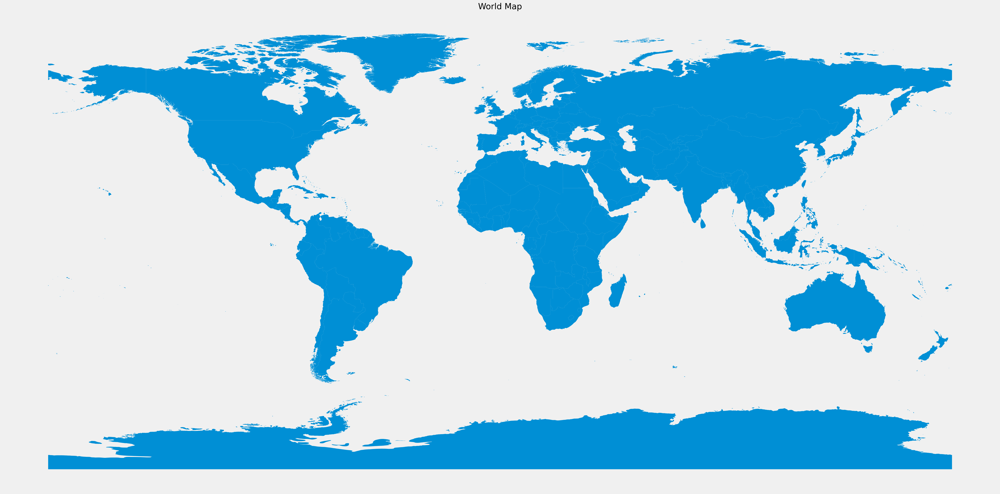

In [16]:
# Visualize shapefile
fig, ax = plt.subplots(figsize = [50, 20])
world.plot(ax = ax)
ax.set_title('World Map')
plt.axis('off')

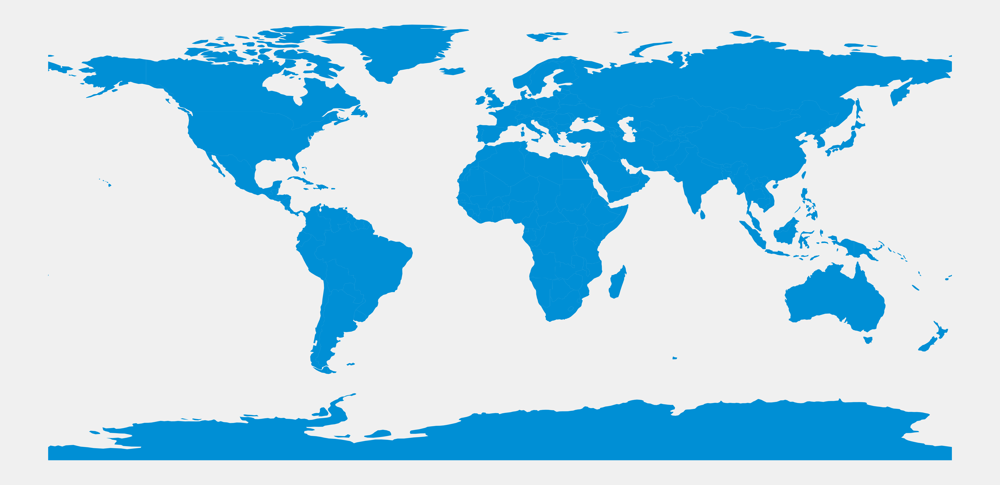

In [34]:
# Visualize GPD data
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world.plot(figsize = [50, 20])
plt.axis('off');

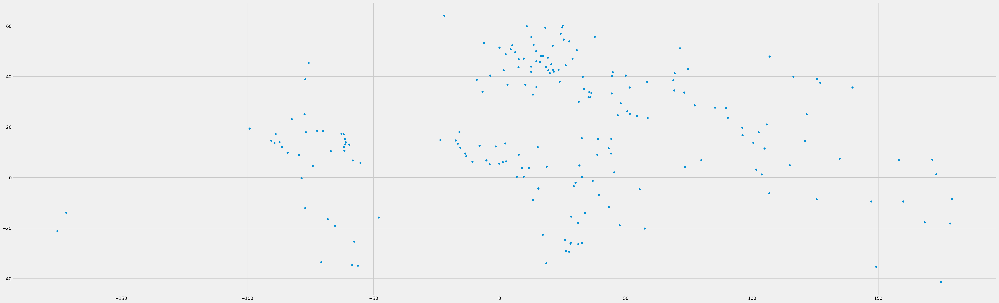

In [32]:
cities = gpd.read_file(gpd.datasets.get_path('naturalearth_cities'))
cities.plot(figsize = [50, 20])

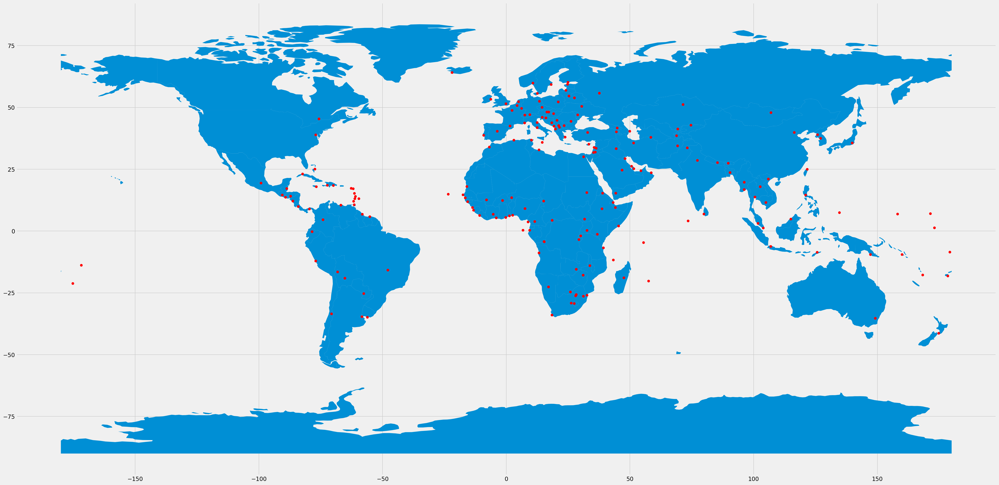

In [33]:
fig, ax = plt.subplots(figsize = [50, 20])
world.plot(ax = ax)
cities.plot(ax = ax, c = 'r')

In [35]:
world.head()

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


Text(0.5, 1.0, 'World Map Based on Population')

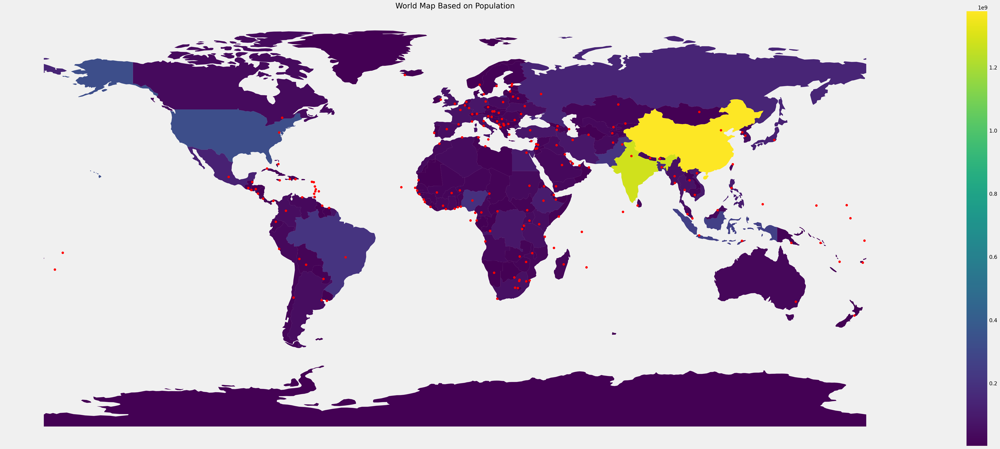

In [47]:
fig, ax = plt.subplots(figsize = [50, 20])
world.plot(ax = ax, column = 'pop_est', legend = True)
cities.plot(ax = ax, c = 'r')
plt.axis('off')
plt.title('World Map Based on Population');

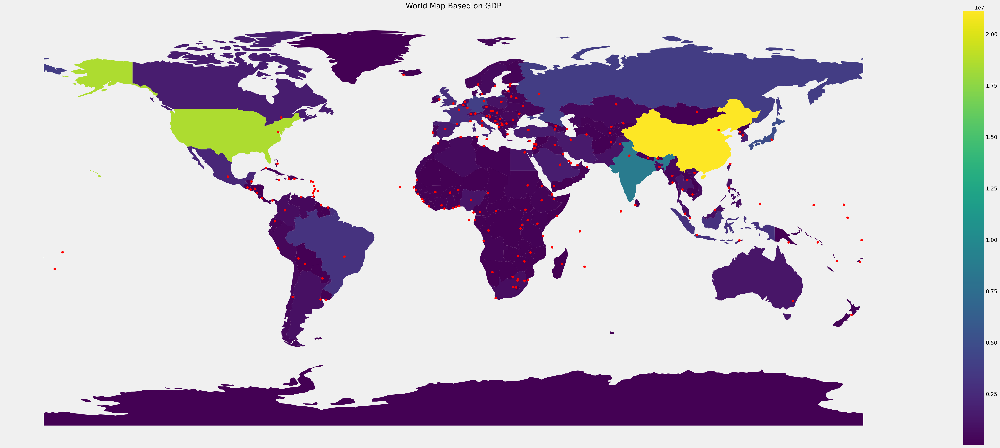

In [58]:
fig, ax = plt.subplots(figsize = [50, 20])
world.plot(ax = ax, column = 'gdp_md_est', legend = True)
cities.plot(ax = ax, c = 'r')
plt.axis('off')
plt.title('World Map Based on GDP');

In [50]:
# Combine datasets
wrld = world.merge(data, left_on = 'name', right_on = 'country')

In [51]:
wrld.head()

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,country_code
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000...",Fiji,24.1,57.8,4.86,63.9,7350,4.23,65.3,2.67,3650,FJ
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...",Tanzania,71.9,18.7,6.01,29.1,2090,9.25,59.3,5.43,702,None
2,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",Canada,5.6,29.1,11.30,31.0,40700,2.87,81.3,1.63,47400,CA
3,18556698,Asia,Kazakhstan,KAZ,460700.0,"POLYGON ((87.35997 49.21498, 86.59878 48.54918...",Kazakhstan,21.5,44.2,4.29,29.9,20100,19.50,68.4,2.60,9070,KZ
4,29748859,Asia,Uzbekistan,UZB,202300.0,"POLYGON ((55.96819 41.30864, 55.92892 44.99586...",Uzbekistan,36.3,31.7,5.81,28.5,4240,16.50,68.8,2.34,1380,UZ


In [53]:
statistics = ['pop_est', 'gdp_md_est', 'child_mort', 'exports', 'health', 'imports', 'income', 'inflation', 'life_expec', 'total_fer', 'gdpp']

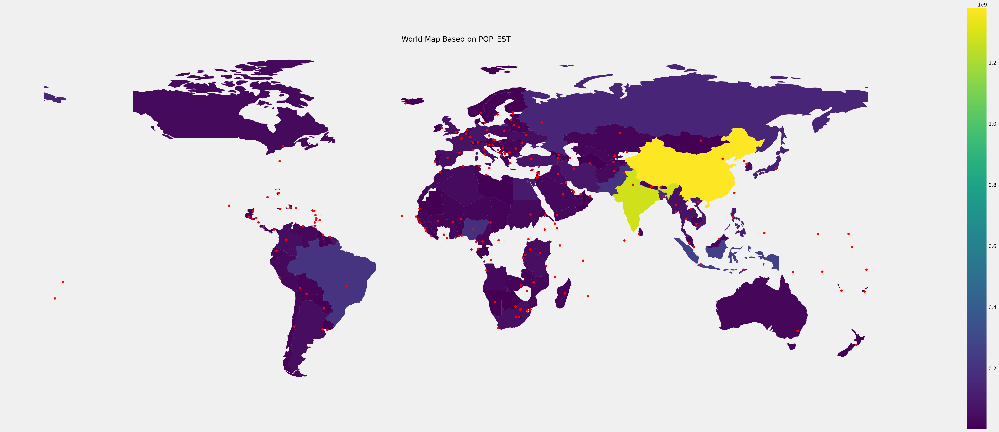

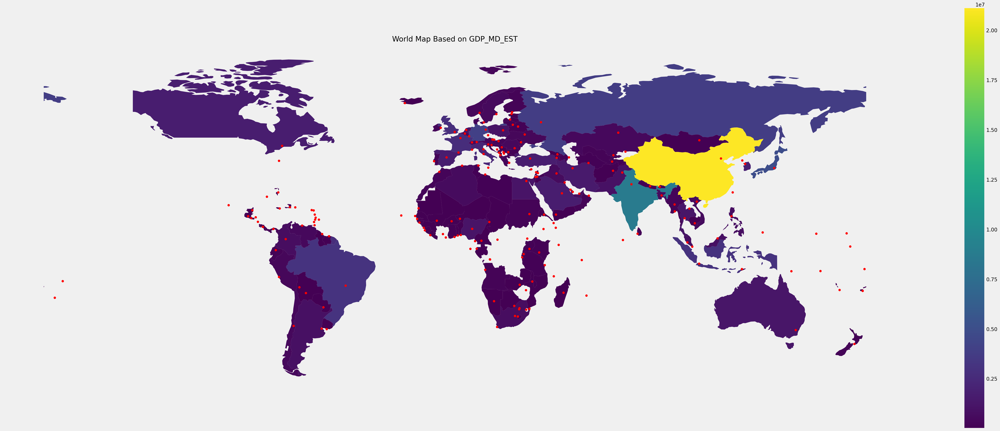

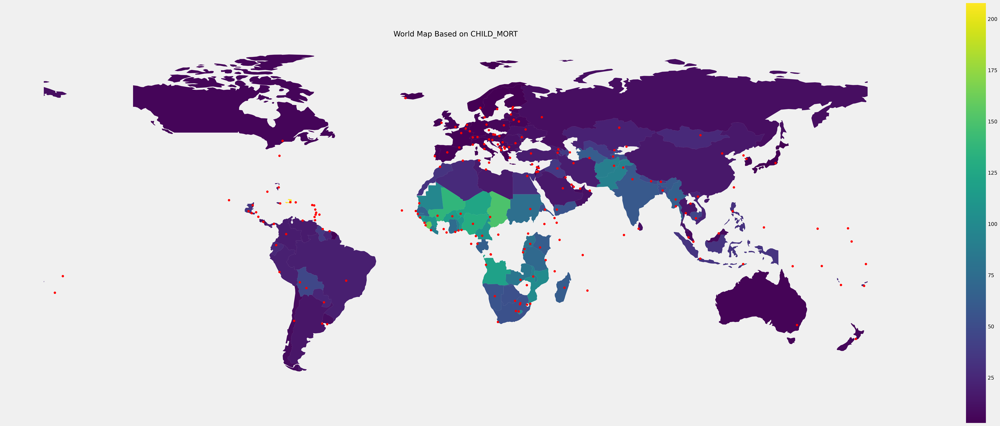

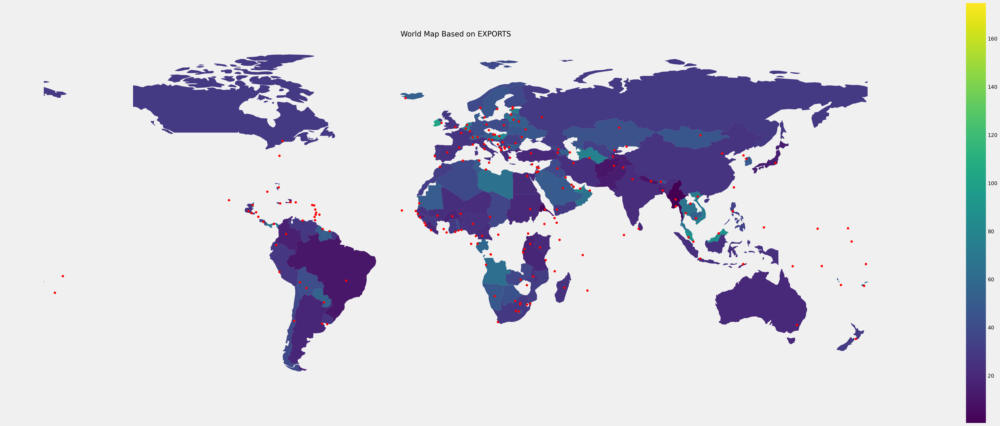

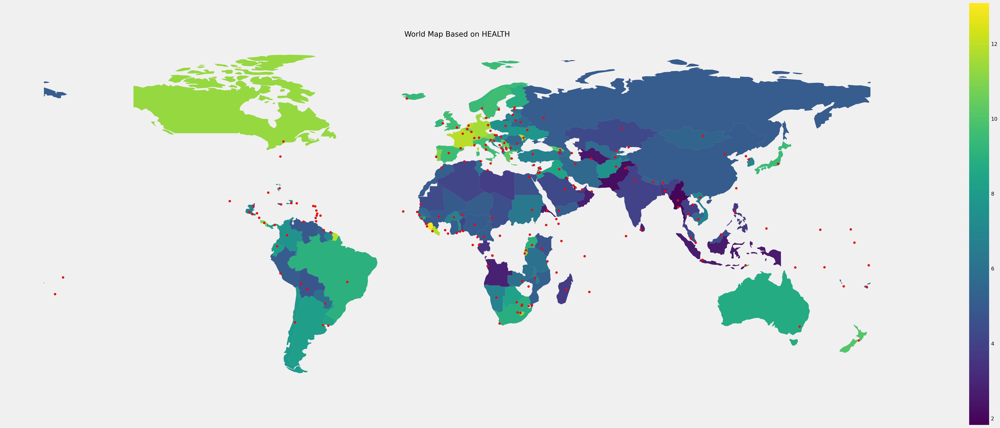

...

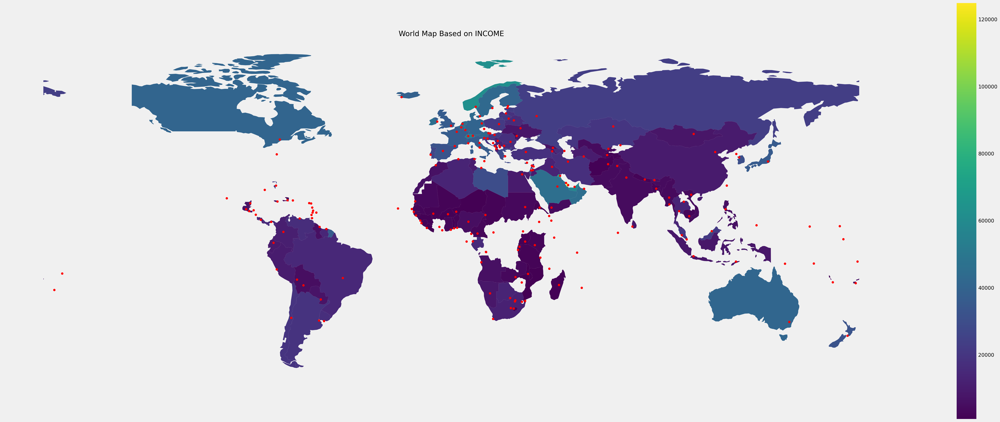

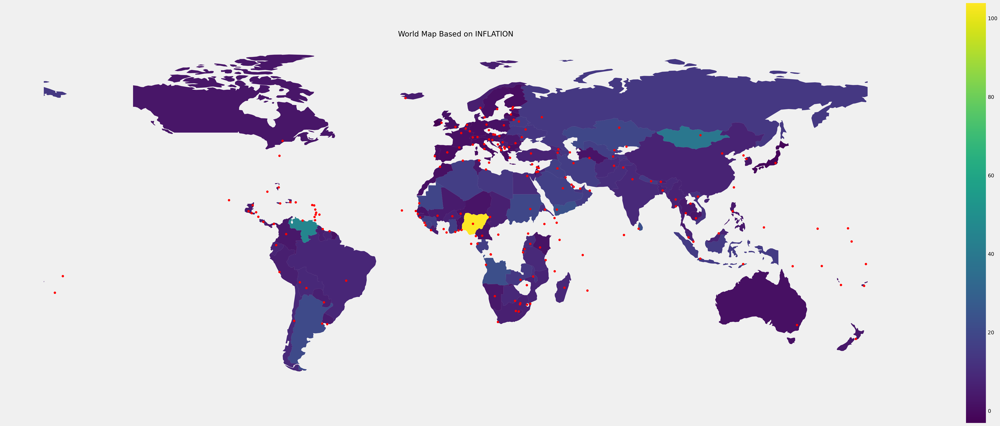

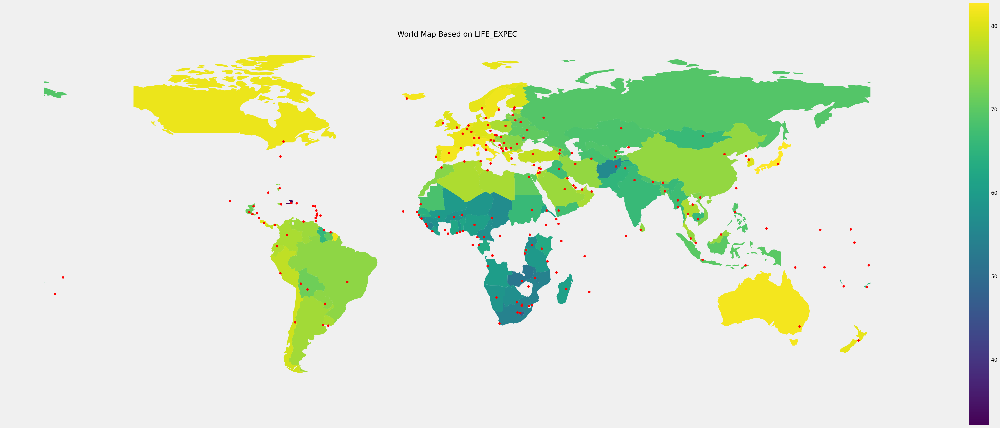

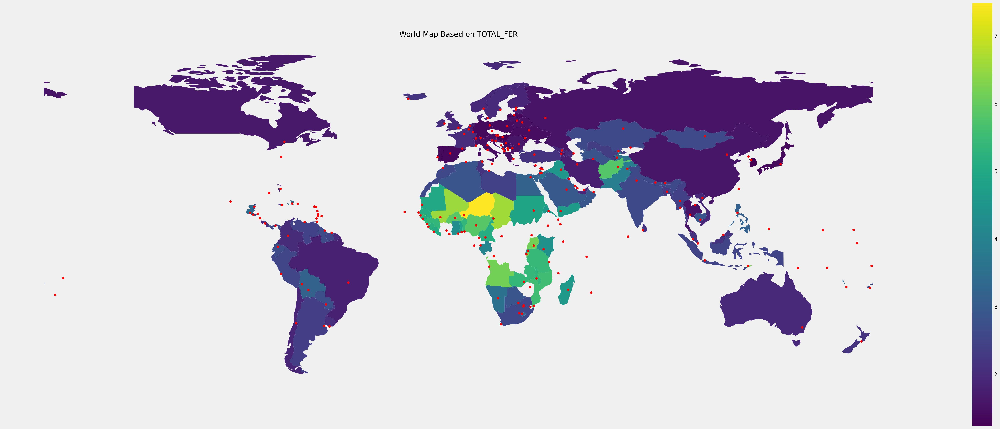

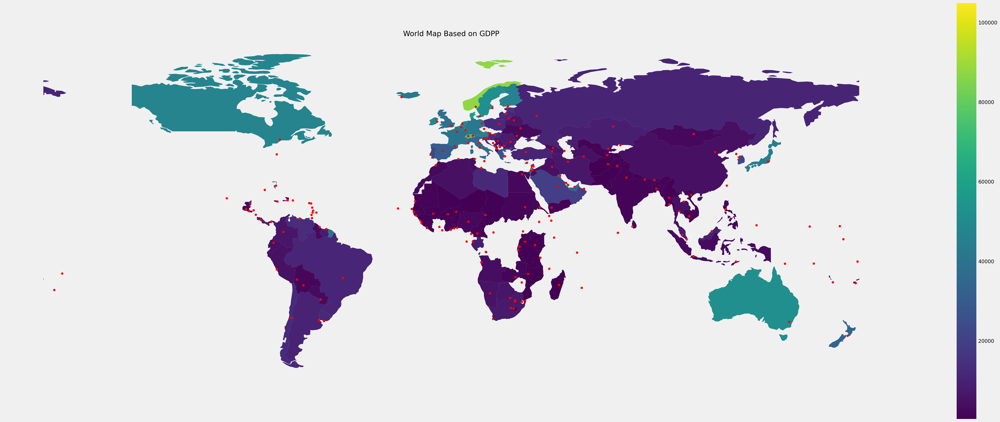

In [61]:
for x in statistics:
    
    fig, ax = plt.subplots(figsize = [50, 20])
    wrld.plot(ax = ax, column = x, legend = True)
    cities.plot(ax = ax, c = 'r')
    plt.axis('off')
    plt.title('World Map Based on {}'.format(x.upper()));